<a href="https://colab.research.google.com/github/ZahraDehghani99/Digital-Image-Processing/blob/main/HW1/DIP_HW1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Home Work 1

## Sampling and quantization

### a) Computes the difference between values in neighboring pixels and Find the number of bytes and size of the image, and display each case.

In [1]:
import numpy as np
import cv2
from google.colab.patches import cv2_imshow # for image display
from skimage import io
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings("ignore")

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


تصویر اصلی ما دارای ۳ کانال می باشد. در تابعی که برای خواندن تصویر استفاده می کنیم امکان استفاده از ۳ فلگ وجود دارد. به صورت پیش فرض فلگ ۱ را داریم  به این معنی که تصویر را به صورت رنگی می خواند. فلگ 0 به معنی این است که تصویر را به صورت سیاه و سفید می خواند و فلگ  ۱- به معنی این است که تصویر را بدون تغییر می خواند.
ما این تصویر را با هر ۳ فلگ چاپ می کنیم مشاهده می شود که تغییری بین این ۳ مورد از لحاظ بصری وجود ندارد پس ما با تصویر سیاه و سفید کار می کنیم تا تعداد کانال کمتری داشته باشیم.

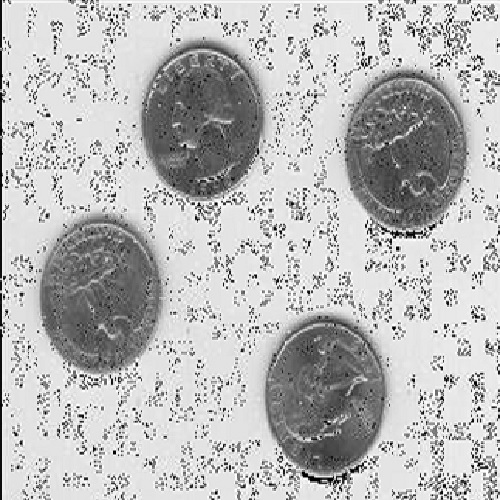


image1 shape : (500, 500)


In [ ]:
image1 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image1.jpg', 0)
cv2_imshow(image1) 
print(f'\nimage1 shape : {image1.shape}')

حال می خواهیم سایز تصویر و تعداد بایت های آن را نمایش دهیم.

In [ ]:
print(f'height of image1 : {image1.shape[0]}')
print(f'width of image1 : {image1.shape[1]}')
# print(f'number of channels of image1 : {image1.shape[2]}') if we don't read image in gray mode
print(f'matrix data type of image1 : {image1.dtype}')
print(f'image1 matrix : \n{image1}')

height of image1 : 500
width of image1 : 500
matrix data type of image1 : uint8
image1 matrix : 
[[ 17  14 205 ... 224 218 216]
 [ 12  16 226 ... 246 248 250]
 [ 11  14 230 ... 247 249 250]
 ...
 [ 12  11 237 ...  29 235 235]
 [ 12  11 237 ... 141 239 245]
 [ 11  11 236 ... 249 244 248]]


همانطور که در خروجی قطعه کد پایین می بینیم بیشترین مقداری که یک پیکسل در این تصویر می تواند داشته باشد ۲۵۵ و کمترین مقدار آن ۰ است. این به این معنی است که تعداد بیت های لازم برای نگه داری شدت روشنایی برای هر پیکسل ۸ بیت است.

In [ ]:
print(f'max element in image1 : {np.amax(image1)}')
print(f'min element in image1 : {np.amin(image1)}')

max element in image1 : 255
min element in image1 : 0


In [ ]:
import os
bits = image1.shape[0]*image1.shape[1]*3*8 # 3 : because we have 3 channels in original image
print(f'number of bits for image: {bits}')
print(f'number of bytes for image: {bits/8}')
print(f"number of bytes in drive : {os.path.getsize('/content/drive/MyDrive/DIP/HW1/images/image1.jpg')}")

number of bits for image: 6000000
number of bytes for image: 750000.0
number of bytes in drive : 138257


محاسبه تفاوت هر پیکسل با همسابه اش

In [ ]:
diff_row = np.diff(image1, axis = 0)
print(f'diff along row shape : {diff_row.shape}')

diff along row shape : (499, 500)


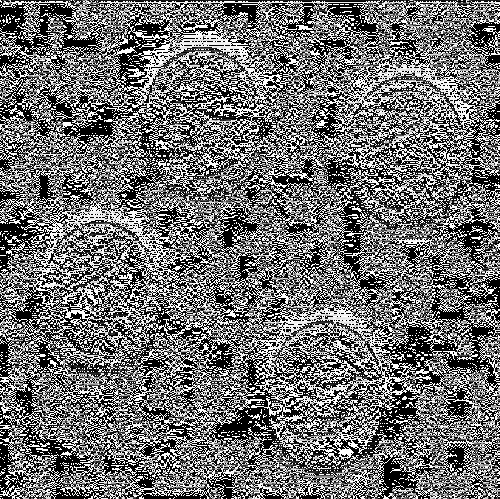

In [ ]:
cv2_imshow(diff_row)

In [ ]:
diff_column = np.diff(image1, axis=1)
print(f'diff along column shape : {diff_column.shape}')

diff along column shape : (500, 499)


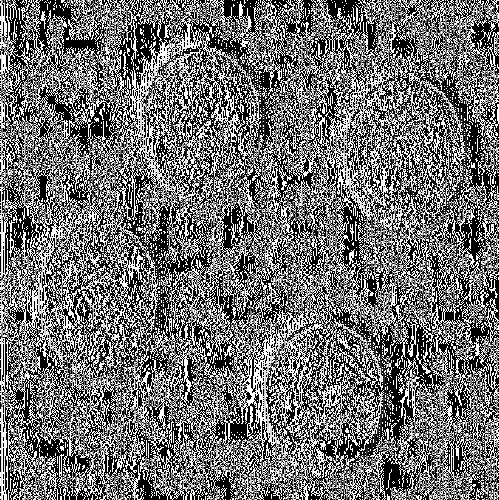

In [ ]:
cv2_imshow(diff_column)

In [ ]:
diff_row == diff_column

False

حال می خواهیم هیستوگرام را برای تصویر رسم کنیم.

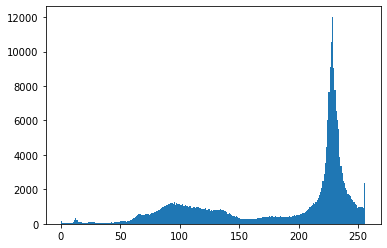

In [ ]:
plt.hist(image1.ravel(),bins = 256, range = [0,256]) 
plt.show()

### b) Representation the image with unit-8 data type, default type (float 64) and by adding bias (128) and plot it.

تصویر اصلی ما از نوع عدد صحیح بدون علامت در بازه ۰ تا ۲۵۵ است. ما آن را به عدد اعشاری تبدیل می کنیم که بازه ۰ تا ۱ دارد. آن را نمایش می دهیم . همانطور که می بینیم دقت تصویر کم شده و تصویر سیاه داریم. در صورتی که در ماتریس مقادیر ۰ نیستند و از ۰ فاصله دارند.


In [ ]:
from skimage.util import img_as_ubyte, img_as_float
image1_float = img_as_float(image1)
print(f'matrix of image1_float: \n{image1_float}')

matrix of image1_float: 
[[0.06666667 0.05490196 0.80392157 ... 0.87843137 0.85490196 0.84705882]
 [0.04705882 0.0627451  0.88627451 ... 0.96470588 0.97254902 0.98039216]
 [0.04313725 0.05490196 0.90196078 ... 0.96862745 0.97647059 0.98039216]
 ...
 [0.04705882 0.04313725 0.92941176 ... 0.11372549 0.92156863 0.92156863]
 [0.04705882 0.04313725 0.92941176 ... 0.55294118 0.9372549  0.96078431]
 [0.04313725 0.04313725 0.9254902  ... 0.97647059 0.95686275 0.97254902]]


In [ ]:
print(f'image1_float shape : {image1_float.shape}')
print(f'image1_float type : {image1_float.dtype}')

image1_float shape : (500, 500)
image1_float type : float64


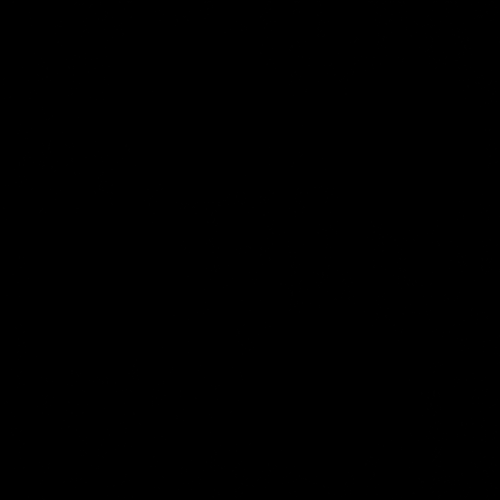

In [ ]:
cv2_imshow(image1_float)

حال دوباره تصویر را از حالت اعشاری به عدد صحیح ی علامت در بازه ی ۰ تا ۲۵۵ تبدیل می کنیم و نمایش می دهیم.

image1_unit shape : uint8



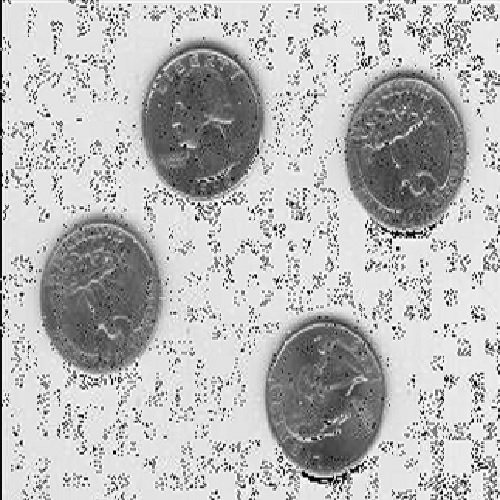

In [ ]:
image1_unit = img_as_ubyte(image1_float)
print(f'image1_unit shape : {image1_unit.dtype}\n')
cv2_imshow(image1_unit)

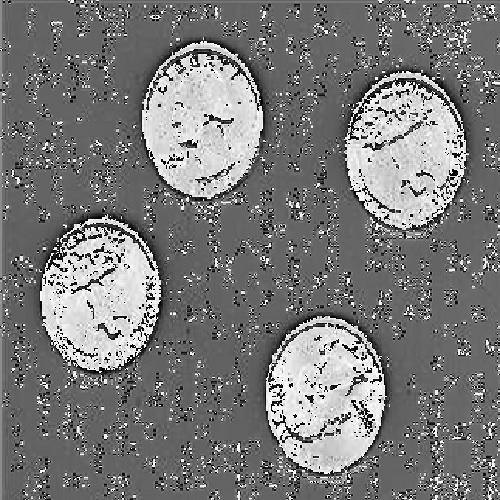

In [ ]:
image1_new = image1 + 128
cv2_imshow(image1_new)

In [ ]:
print(f'matrix of image1_new : \n{image1_new}')

matrix of image1_new : 
[[[145 145 145]
  [142 142 142]
  [ 77  77  77]
  ...
  [ 96  96  96]
  [ 90  90  90]
  [ 88  88  88]]

 [[140 140 140]
  [144 144 144]
  [ 98  98  98]
  ...
  [118 118 118]
  [120 120 120]
  [122 122 122]]

 [[139 139 139]
  [142 142 142]
  [102 102 102]
  ...
  [119 119 119]
  [121 121 121]
  [122 122 122]]

 ...

 [[140 140 140]
  [139 139 139]
  [109 109 109]
  ...
  [157 157 157]
  [107 107 107]
  [107 107 107]]

 [[140 140 140]
  [139 139 139]
  [109 109 109]
  ...
  [ 13  13  13]
  [111 111 111]
  [117 117 117]]

 [[139 139 139]
  [139 139 139]
  [108 108 108]
  ...
  [121 121 121]
  [116 116 116]
  [120 120 120]]]


### c) How many bits can manage so that we still have a good image? Plot all of the cases.

useful link : https://scikit-image.org/docs/dev/user_guide/data_types.html#rescaling-intensity-values

In [ ]:
from skimage import exposure
image1bit = exposure.rescale_intensity(image1, in_range=(0, 2**1 - 1), out_range=(0, 2**1 - 1))
image2bit = exposure.rescale_intensity(image1, in_range=(0, 2**2 - 1), out_range=(0, 2**2 - 1))
image3bit = exposure.rescale_intensity(image1, in_range=(0, 2**3 - 1), out_range=(0, 2**3 - 1))
image4bit = exposure.rescale_intensity(image1, in_range=(0, 2**4 - 1), out_range=(0, 2**4 - 1))
image5bit = exposure.rescale_intensity(image1, in_range=(0, 2**5 - 1), out_range=(0, 2**5 - 1))
image6bit = exposure.rescale_intensity(image1, in_range=(0, 2**6 - 1), out_range=(0, 2**6 - 1))
image7bit = exposure.rescale_intensity(image1, in_range=(0, 2**7 - 1), out_range=(0, 2**7 - 1))
image8bit = exposure.rescale_intensity(image1, in_range=(0, 2**8 - 1), out_range=(0, 2**8 - 1))

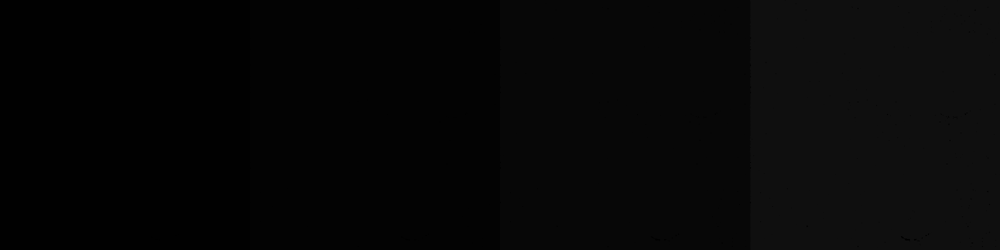

In [ ]:
first4bit = np.hstack([image1bit, image2bit, image3bit, image4bit]) 
cv2_imshow(first4bit)

همانطور که می بینیم تعداد بیت های کمتر از ۸ نمی توانند جزییات تصویر را به خوبی بیان کنند.

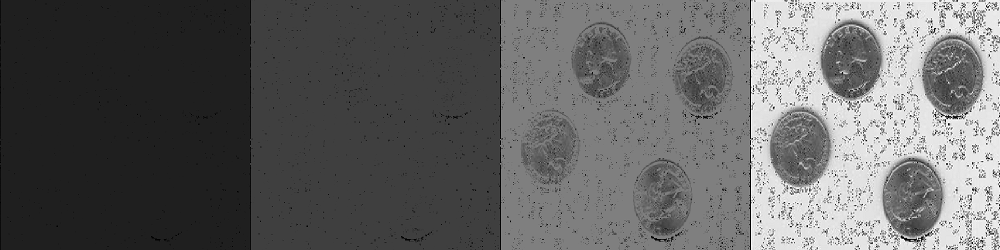

In [ ]:
second4bit = np.hstack([image5bit, image6bit, image7bit, image8bit]) 
cv2_imshow(second4bit)

## Geometrical spatial operations

### 2- Perform the scaling (1.5*1.5), translation and rotation (90°) operations for image2 and plot the final image in each case.

scaling using resize function:

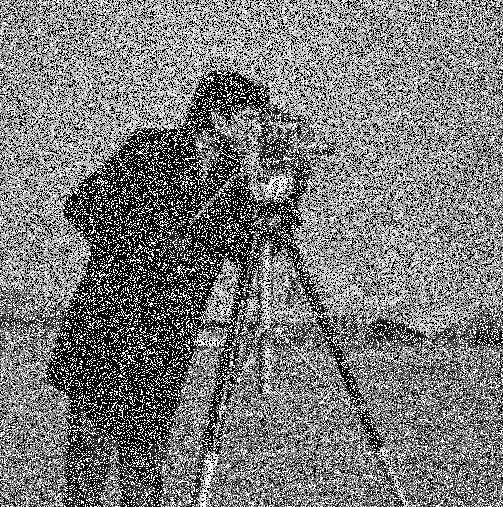


image2 shape : (507, 503, 3)


In [ ]:
image2 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image2.jpg', -1)
cv2_imshow(image2)
print(f'\nimage2 shape : {image2.shape}')

scaling using affine transformation:

image 2 before and after scaling


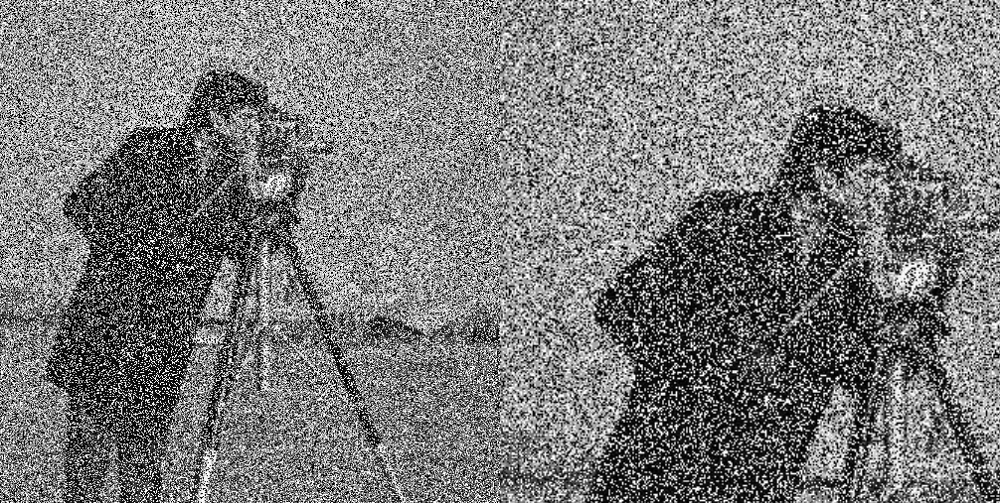

In [ ]:
height, width = image2.shape[:2]
Scale = np.float32([[1.5, 0, 0], [0, 1.5, 0]])
image2_scale = cv2.warpAffine(image2, Scale, (width, height))
before_after_scale = np.hstack([image2, image2_scale])
print('image 2 before and after scaling')
cv2_imshow(before_after_scale)

در این قسمت می خواهیم تا تصویر را به اندازه ۱.۵ برایر سطر و ستون جابجا کنیم

image 2 before and after translation


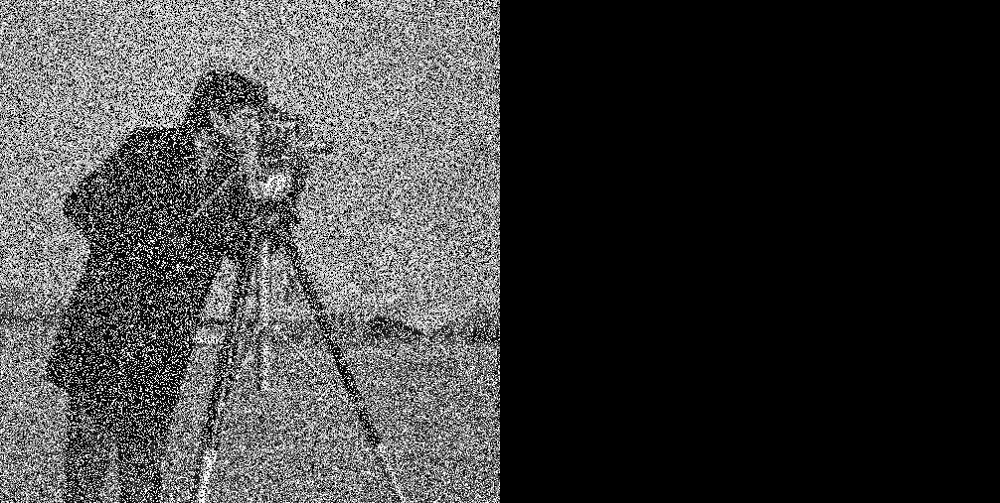

In [ ]:
# Store height and width of the image
height, width = image2.shape[:2]
  
new_height, new_width = height*1.5, width*1.5
  
T = np.float32([[1, 0, new_width], [0, 1, new_height]])
  
# We use warpAffine to transform
# the image using the matrix, T
image2_translation = cv2.warpAffine(image2, T, (width, height))

before_after = np.hstack([image2, image2_translation])  
print(f'image 2 before and after translation')
cv2_imshow(before_after)

حال اگر بخواهیم تصویر را به اندازه ربع سطر و ستون جابجا کنیم به صورت زیر در می آید.

image 2 before and after translation


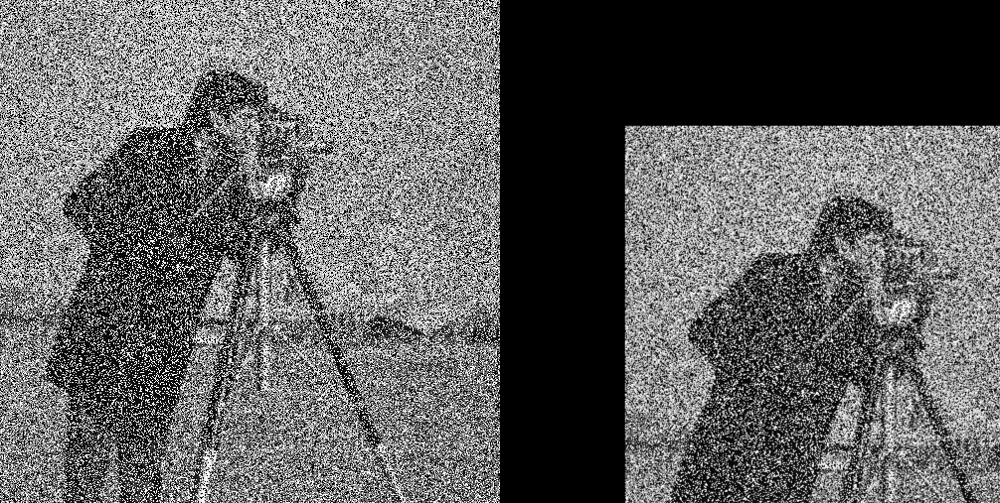

In [ ]:
# Store height and width of the image
height, width = image2.shape[:2]
  
quarter_height, quarter_width = height / 4, width / 4
  
T = np.float32([[1, 0, quarter_width], [0, 1, quarter_height]])
  
# We use warpAffine to transform
# the image using the matrix, T
image2_translation = cv2.warpAffine(image2, T, (width, height))
  
before_after = np.hstack([image2, image2_translation])  
print(f'image 2 before and after translation')
cv2_imshow(before_after)

Rotation

image2 before and after rotation


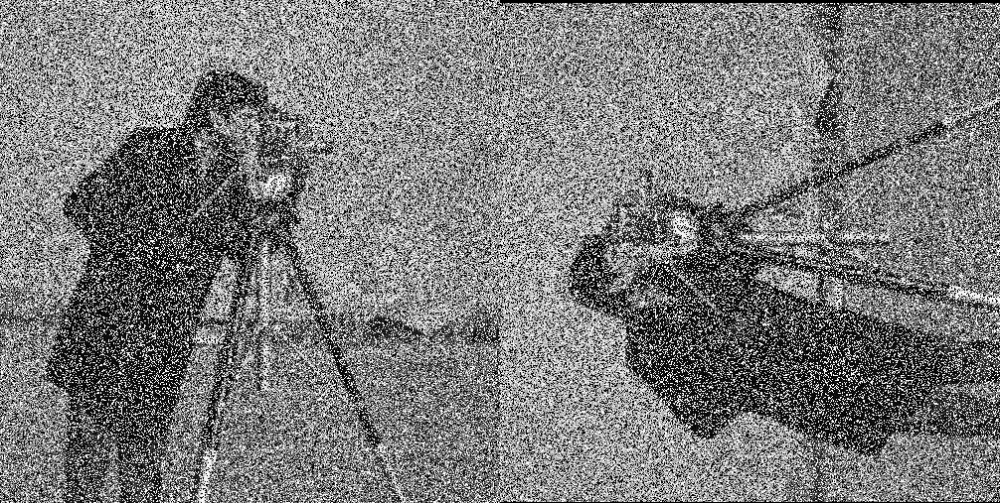

In [ ]:
height, width = image2.shape[:2]
# dividing height and width by 2 to get the center of the image
# get the center coordinates of the image to create the 2D rotation matrix
center = (width/2, height/2)

# using cv2.getRotationMatrix2D() to get the rotation matrix
rotate_matrix = cv2.getRotationMatrix2D(center=center, angle=90, scale=1)

# rotate the image using cv2.warpAffine
rotated_image2 = cv2.warpAffine(src=image2, M=rotate_matrix, dsize=(width, height))
before_after_rotation = np.hstack([image2, rotated_image2])
print('image2 before and after rotation')
cv2_imshow(before_after_rotation)

## Filtering in Spatial Domain

### 3- Apply each spatial filters to the image according to the below table and compare the original image and the image after using the filter.

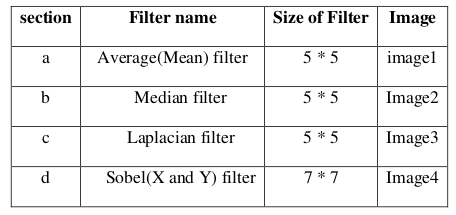

#### Averaging

در شکل زیر اعمال فیلتر میانگین گیری را روی تصویر یک می بنیم و هر دو فیلتر یک کار را انجام می دهند.

image1 before and after bluring filter


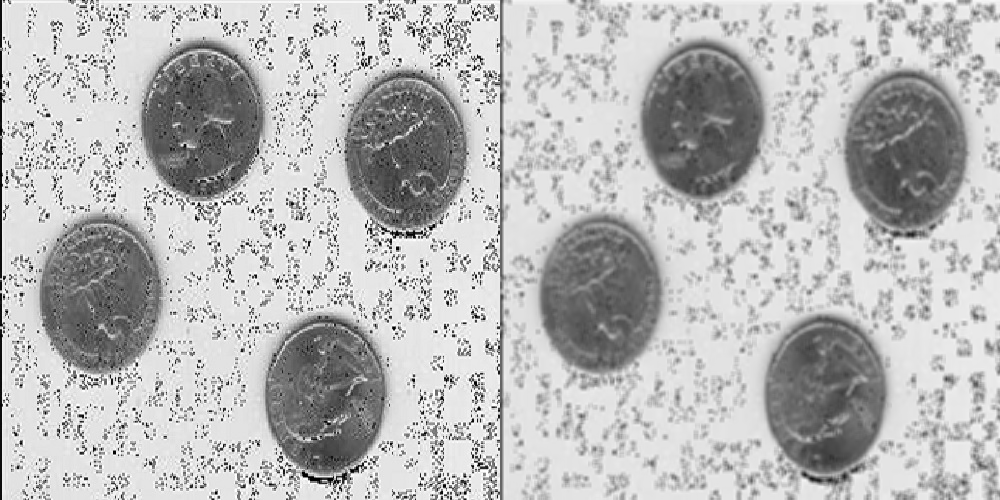


image1 before and after box filter


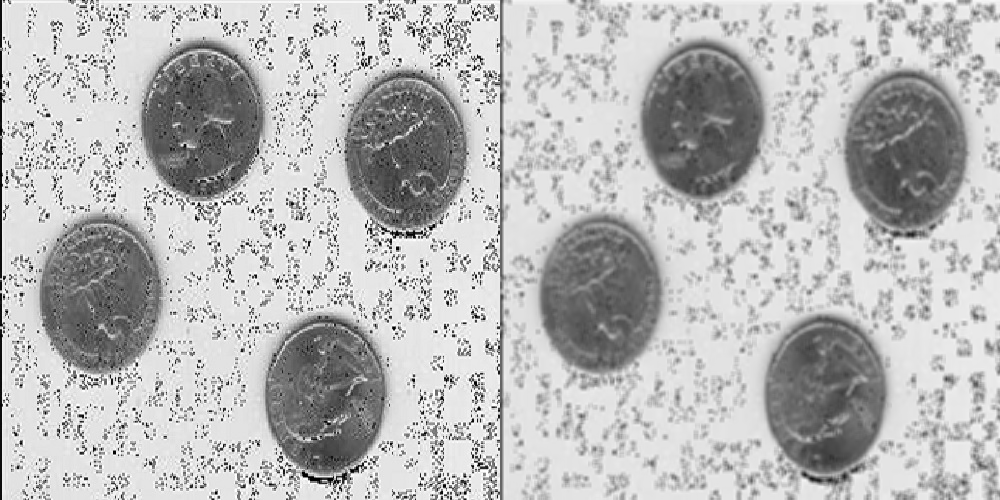

In [ ]:
image1 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image1.jpg')
image1_blur = cv2.blur(image1,(5,5))
image1_boxfiler = cv2.boxFilter(image1, -1, (5, 5), normalize=True) 
before_after_blur = np.hstack([image1, image1_blur])
before_after_boxfilter = np.hstack([image1, image1_boxfiler]) 
print('image1 before and after bluring filter')
cv2_imshow(before_after_blur)
print('\nimage1 before and after box filter')
cv2_imshow(before_after_boxfilter)

#### Median

خیلی نویز تصویر کمتر شده

image2 before and after median filter


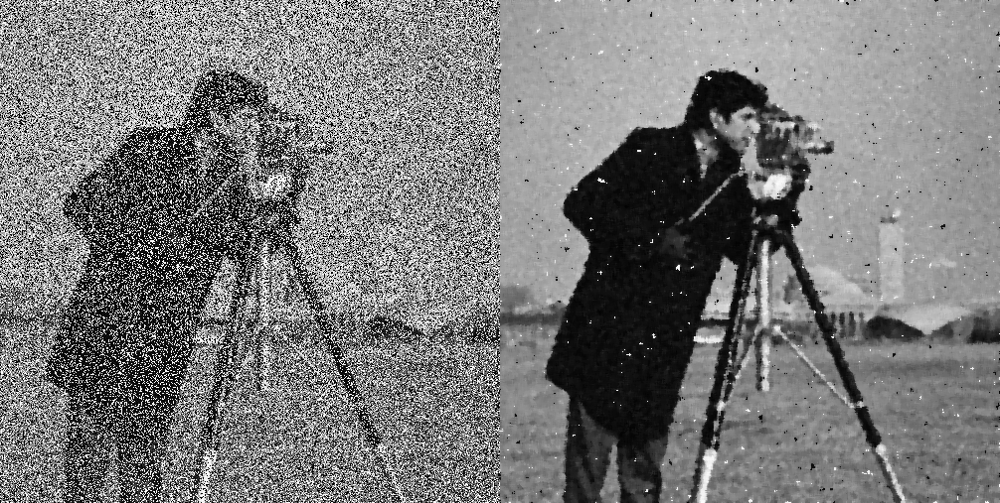

In [3]:
image2 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image2.jpg')
image2_median = cv2.medianBlur(image2,5)
before_after_median = np.hstack([image2, image2_median])
print('image2 before and after median filter')
cv2_imshow(before_after_median)

#### Laplacian

image3 before and after laplacian filter


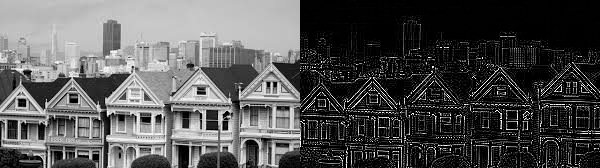

In [ ]:
image3 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image3.jpg')
image3_laplace = cv2.Laplacian(image3,5)
before_after_laplace = np.hstack([image3, image3_laplace])
print('image3 before and after laplacian filter')
cv2_imshow(before_after_laplace)

#### Sobel

dx = 1 => sobel edge detection on the x axis

useful link : https://learnopencv.com/edge-detection-using-opencv/

image4 before and after sobel X filter


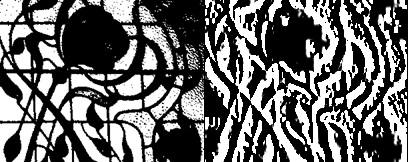


image4 before and after sobel Y filter


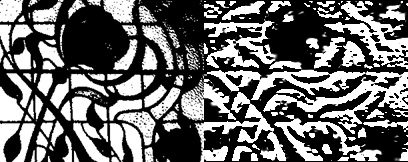


image4 before and after sobel X and Y filter


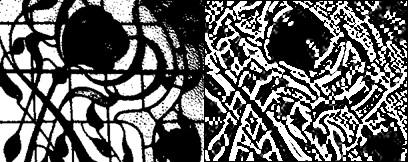

In [ ]:
image4 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image4.jpg')
sobelx = cv2.Sobel(image4,cv2.CV_8U,1,0,ksize=7)
sobely = cv2.Sobel(image4,cv2.CV_8U,0,1,ksize=7)
sobelxy = cv2.Sobel(image4,cv2.CV_8U,1,1,ksize=7)
before_after_sobelx = np.hstack([image4, sobelx])
before_after_sobely = np.hstack([image4, sobely])
before_after_sobelxy = np.hstack([image4, sobelxy])
print('image4 before and after sobel X filter')
cv2_imshow(before_after_sobelx)
print('\nimage4 before and after sobel Y filter')
cv2_imshow(before_after_sobely) 
print('\nimage4 before and after sobel X and Y filter')
cv2_imshow(before_after_sobelxy) 

## Filtering in Frequency Domain

### 4- Apply frequency filters in each case and compare the original image and the image after using the filter:



#### (a) Apply frequency spectrum with Fast Fourier Transformation (FFT), centered spectrum, decentralized spectrum and inverse FFT on image5 and show them.

در قطعه کد زیر با استفاده از کتابخانه ی نامپای تبدیل به فضای فرکانس رو انجام می دهیم. سپس با شیفت کردن، فرکانس صفر را به مرکز انتقال می دهیم. اینکار تصویر را واضح تر می کند. سپس عکس این کاری ک انجام دادیم رو انجام می دهیم و در نهایت از فضای فرکانس به فضای عکس برمیگردیم.

در قطعه کد زیر تصاویر را بدون هیچ تبدیلی نمایش میدهیم. همانطور که می بینیم از فضای فرکانس نمای واضحی نداریم.

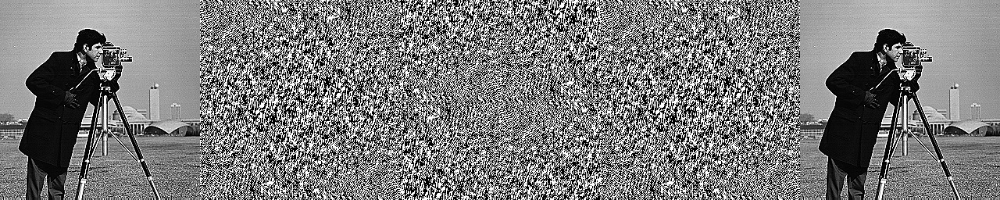

In [ ]:
image5 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image5.jpg')
image5_c1 = cv2.cvtColor(image5, cv2.COLOR_BGR2GRAY)
image5_c2 = np.fft.fft2(image5_c1)
image5_c3 = np.fft.fftshift(image5_c2)
image5_c4 = np.fft.ifftshift(image5_c3)
image5_c5 = np.fft.ifft2(image5_c4)

result = np.hstack([image5_c1, image5_c2, image5_c3, image5_c4, image5_c5])
cv2_imshow(result)

اما در قطعه کد زیر تصاویر در حوزه ی فرکانس را با تبدیل لگاریتم می بینیم که اینکار باعث می شود تصویر را روشن تر و واضح تر داشته باشیم.

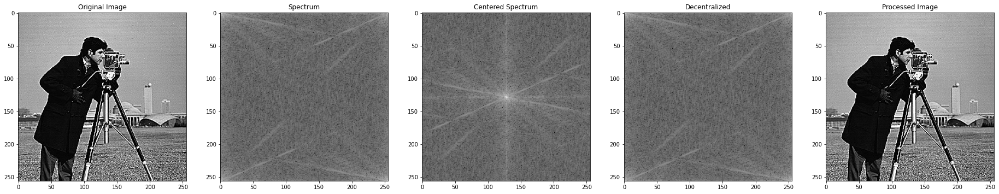

In [ ]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(151), plt.imshow(image5_c1, "gray"), plt.title("Original Image")
plt.subplot(152), plt.imshow(np.log(1+np.abs(image5_c2)), "gray"), plt.title("Spectrum")
plt.subplot(153), plt.imshow(np.log(1+np.abs(image5_c3)), "gray"), plt.title("Centered Spectrum")
plt.subplot(154), plt.imshow(np.log(1+np.abs(image5_c4)), "gray"), plt.title("Decentralized")
plt.subplot(155), plt.imshow(np.abs(image5_c5), "gray"), plt.title("Processed Image")
plt.show()

https://hicraigchen.medium.com/digital-image-processing-using-fourier-transform-in-python-bcb49424fd82

#### (b) Apply Ideal Low Pass Filter (ILPF) and Ideal High Pass Filter (IHPF) on image5 and show them.

In [ ]:
def lowPassFiltering(img,size):#Transfer parameters are Fourier transform spectrogram and filter size
    h, w = img.shape[0:2]#Getting image properties
    h1,w1 = int(h/2), int(w/2)#Find the center point of the Fourier spectrum
    mask = np.zeros((h, w), np.uint8)#Define a blank black image with the same size as the Fourier Transform Transfer
    mask[h1-int(size/2):h1+int(size/2), w1-int(size/2):w1+int(size/2)] = 1#Center point plus or minus half of the filter size, forming a filter size that defines the size, then set to 1, preserving the low frequency part
    img3=mask*img #A low-pass filter is obtained by multiplying the defined low-pass filter with the incoming Fourier spectrogram one-to-one.
    return img3

def highPassFiltering(img,size):#Transfer parameters are Fourier transform spectrogram and filter size
    h, w = img.shape[0:2]#Getting image properties
    h1,w1 = int(h/2), int(w/2)#Find the center point of the Fourier spectrum
    img[h1-int(size/2):h1+int(size/2), w1-int(size/2):w1+int(size/2)] = 0#Center point plus or minus half of the filter size, forming a filter size that defines the size, then set to 0
    return img

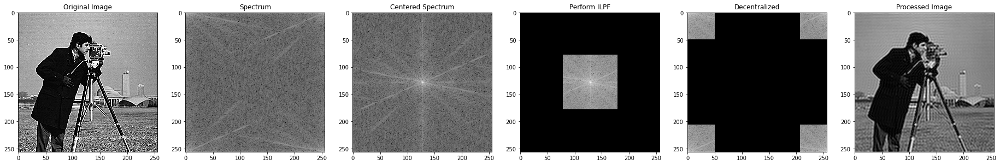

In [ ]:
image5 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image5.jpg')
image5_c1 = cv2.cvtColor(image5, cv2.COLOR_BGR2GRAY)
image5_c2 = np.fft.fft2(image5_c1)
image5_c3 = np.fft.fftshift(image5_c2)
image5_c4 = lowPassFiltering(image5_c3, 100)
image5_c5 = np.fft.ifftshift(image5_c4)
image5_c6 = np.fft.ifft2(image5_c5)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161), plt.imshow(image5_c1, "gray"), plt.title("Original Image")
plt.subplot(162), plt.imshow(np.log(1+np.abs(image5_c2)), "gray"), plt.title("Spectrum")
plt.subplot(163), plt.imshow(np.log(1+np.abs(image5_c3)), "gray"), plt.title("Centered Spectrum")
plt.subplot(164), plt.imshow(np.log(1+np.abs(image5_c4)), "gray"), plt.title("Perform ILPF")
plt.subplot(165), plt.imshow(np.log(1+np.abs(image5_c5)), "gray"), plt.title("Decentralized")
plt.subplot(166), plt.imshow(np.abs(image5_c6), "gray"), plt.title("Processed Image")
plt.show()

In [ ]:
image5_c2.dtype

dtype('complex128')

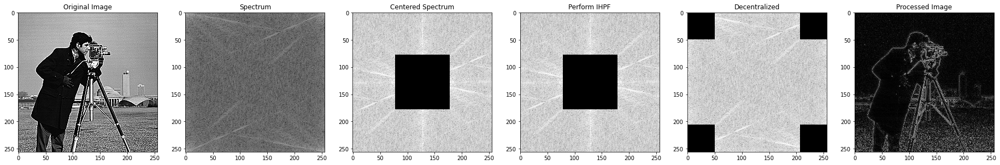

In [ ]:
image5 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image5.jpg')
image5_c1 = cv2.cvtColor(image5, cv2.COLOR_BGR2GRAY)
image5_c2 = np.fft.fft2(image5_c1)
image5_c3 = np.fft.fftshift(image5_c2)
image5_c4 = highPassFiltering(image5_c3, 100)
image5_c5 = np.fft.ifftshift(image5_c4)
image5_c6 = np.fft.ifft2(image5_c5)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161), plt.imshow(image5_c1, "gray"), plt.title("Original Image")
plt.subplot(162), plt.imshow(np.log(1+np.abs(image5_c2)), "gray"), plt.title("Spectrum")
plt.subplot(163), plt.imshow(np.log(1+np.abs(image5_c3)), "gray"), plt.title("Centered Spectrum")
plt.subplot(164), plt.imshow(np.log(1+np.abs(image5_c4)), "gray"), plt.title("Perform IHPF")
plt.subplot(165), plt.imshow(np.log(1+np.abs(image5_c5)), "gray"), plt.title("Decentralized")
plt.subplot(166), plt.imshow(np.abs(image5_c6), "gray"), plt.title("Processed Image")
plt.show()

#### (c) Apply Gaussian Smoothing with 3, 5, 7 and 9 kernel size on image6 and show them

Gaussian filter kernel 3


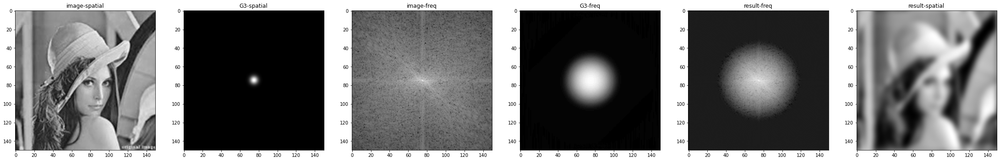

In [5]:
import scipy.fftpack as fp
from scipy import signal
im = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/image6.jpg', -1)
im_gray = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)
gauss_kernel = np.outer(signal.gaussian(im.shape[0], 3), signal.gaussian(im.shape[1], 3))
freq = fp.fft2(im_gray)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain
im3 = fp.ifft2(convolved).real

plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
print("Gaussian filter kernel 3")
plt.subplot(161), plt.imshow(im_gray, "gray"), plt.title("image-spatial")
plt.subplot(162), plt.imshow(gauss_kernel, "gray"), plt.title("G3-spatial")
plt.subplot(163), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq")
plt.subplot(164), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq_kernel))).astype(int), "gray"), plt.title("G3-freq")
plt.subplot(165), plt.imshow((20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int), "gray"), plt.title("result-freq")
plt.subplot(166), plt.imshow(im3, "gray"), plt.title("result-spatial")
plt.show()


Gaussian filter kernel 5


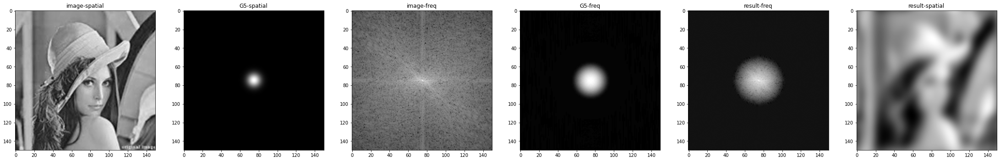

In [ ]:
gauss_kernel = np.outer(signal.gaussian(im.shape[0], 5), signal.gaussian(im.shape[1], 5))
freq = fp.fft2(im_gray)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain
im5 = fp.ifft2(convolved).real

plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
print("Gaussian filter kernel 5")
plt.subplot(161), plt.imshow(im_gray, "gray"), plt.title("image-spatial")
plt.subplot(162), plt.imshow(gauss_kernel, "gray"), plt.title("G5-spatial")
plt.subplot(163), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq")
plt.subplot(164), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq_kernel))).astype(int), "gray"), plt.title("G5-freq")
plt.subplot(165), plt.imshow((20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int), "gray"), plt.title("result-freq")
plt.subplot(166), plt.imshow(im5, "gray"), plt.title("result-spatial")
plt.show()

Gaussian filter kernel 7


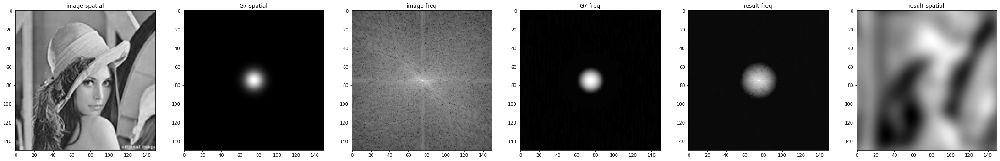

In [ ]:
gauss_kernel = np.outer(signal.gaussian(im.shape[0], 7), signal.gaussian(im.shape[1], 7))
freq = fp.fft2(im_gray)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain
im7 = fp.ifft2(convolved).real

plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
print("Gaussian filter kernel 7")
plt.subplot(161), plt.imshow(im_gray, "gray"), plt.title("image-spatial")
plt.subplot(162), plt.imshow(gauss_kernel, "gray"), plt.title("G7-spatial")
plt.subplot(163), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq")
plt.subplot(164), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq_kernel))).astype(int), "gray"), plt.title("G7-freq")
plt.subplot(165), plt.imshow((20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int), "gray"), plt.title("result-freq")
plt.subplot(166), plt.imshow(im7, "gray"), plt.title("result-spatial")
plt.show()

Gaussian filter kernel 9


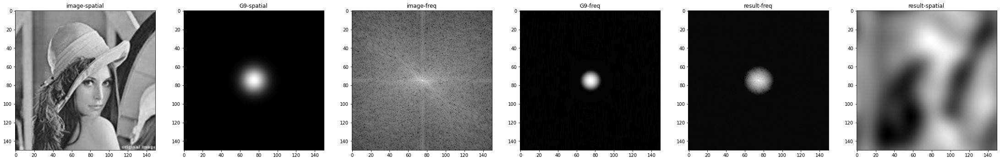

In [ ]:
gauss_kernel = np.outer(signal.gaussian(im.shape[0], 9), signal.gaussian(im.shape[1], 9))
freq = fp.fft2(im_gray)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain
im9 = fp.ifft2(convolved).real

plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
print("Gaussian filter kernel 9")
plt.subplot(161), plt.imshow(im_gray, "gray"), plt.title("image-spatial")
plt.subplot(162), plt.imshow(gauss_kernel, "gray"), plt.title("G9-spatial")
plt.subplot(163), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq")
plt.subplot(164), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq_kernel))).astype(int), "gray"), plt.title("G9-freq")
plt.subplot(165), plt.imshow((20*np.log10( 0.1 + fp.fftshift(convolved))).astype(int), "gray"), plt.title("result-freq")
plt.subplot(166), plt.imshow(im9, "gray"), plt.title("result-spatial")
plt.show()

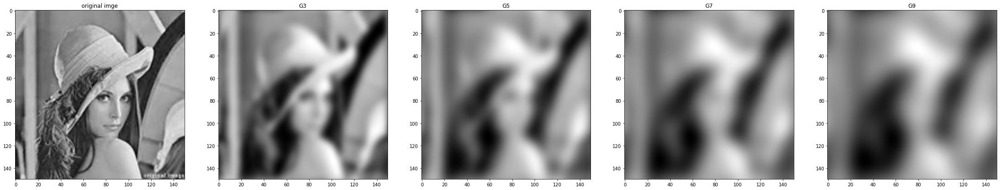

In [ ]:
plt.figure(figsize=(6.4*6, 4.8*6), constrained_layout=False)
plt.subplot(151), plt.imshow(im_gray, "gray"), plt.title("original imge")
plt.subplot(152), plt.imshow(im3, "gray"), plt.title("G3")
plt.subplot(153), plt.imshow(im5, "gray"), plt.title("G5")
plt.subplot(154), plt.imshow(im7, "gray"), plt.title("G7")
plt.subplot(155), plt.imshow(im9, "gray"), plt.title("G9")
plt.show()

### 5- Remove the noise of images 1-2-3-4 with proper filters.

#### image 1

moire pattern

In [11]:
def gaussLowPassFilter(shape, radius=10):  #  Gaussian low pass filter 
    u, v = np.mgrid[-1:1:2.0 / shape[0], -1:1:2.0 / shape[1]]
    D = np.sqrt(u ** 2 + v ** 2)
    D0 = radius / shape[0]
    kernel = np.exp(- (D ** 2) / (2 * D0 ** 2))
    return kernel

def gaussHighPassFilter(shape, radius=10):  #  Gaussian low pass filter 
  kernel = 1 - gaussLowPassFilter(shape, radius)
  return kernel   

def butterworthNRFilter(shape, radius=9, uk=60, vk=80, n=2):  #  Butterworth notch bandstop filter 
    M, N = shape[1], shape[0]
    u, v = np.meshgrid(np.arange(M), np.arange(N))
    Dm = np.sqrt((u - M // 2 - uk) ** 2 + (v - N // 2 - vk) ** 2)
    Dp = np.sqrt((u - M // 2 + uk) ** 2 + (v - N // 2 + vk) ** 2)
    D0 = radius
    n2 = n * 2
    kernel = (1 / (1 + (D0 / (Dm + 1e-6)) ** n2)) * (1 / (1 + (D0 / (Dp + 1e-6)) ** n2))
    return kernel

def LaplacianFilter(shape):  #  frequency domain  Laplacian  filter 
    u, v = np.mgrid[-1:1:2.0/shape[0], -1:1:2.0/shape[1]]
    D = np.sqrt(u**2 + v**2)
    kernel = -4 * np.pi**2 * D**2
    return kernel
    
def imgFrequencyFilter(img, filterType="GaussLP", radius=10):
  normalize = lambda x: (x - x.min()) / (x.max() - x.min() + 1e-8)
  # (1)  Edge fill 
  imgPad = np.pad(img, ((0, img.shape[0]), (0, img.shape[1])), mode="reflect")
  # (2)  Centralization : f(x,y) * (-1)^(x+y)
  mask = np.ones(imgPad.shape)
  mask[1::2, ::2] = -1
  mask[::2, 1::2] = -1
  imgPadCen = imgPad * mask
  # (3)  The Fourier transform 
  fft = np.fft.fft2(imgPadCen)

  # (4)  structure   Frequency domain filter transfer function :
  if filterType == "GaussLP":
    print(filterType)
    freFilter = gaussLowPassFilter(imgPad.shape, radius=60)
  elif filterType == "GaussHP":
    print(filterType)
    freFilter = 1 - gaussLowPassFilter(imgPad.shape, radius=60)
  elif filterType == "ButterworthNR":
    print(filterType)
    freFilter = butterworthNRFilter(imgPad.shape, radius=9, uk=60, vk=80, n=2)  #  Butterworth notch bandstop filter 
  elif filterType == "MButterworthNR":
    print(filterType)
    BNRF1 = butterworthNRFilter(imgPad.shape, radius=9, uk=60, vk=80, n=2)  #  Butterworth notch bandstop filter 
    BNRF2 = butterworthNRFilter(imgPad.shape, radius=9, uk=-60, vk=80, n=2)
    BNRF3 = butterworthNRFilter(imgPad.shape, radius=9, uk=60, vk=160, n=2)
    BNRF4 = butterworthNRFilter(imgPad.shape, radius=9, uk=-60, vk=160, n=2)
    freFilter = BNRF1 * BNRF2 * BNRF3 * BNRF4
  elif filterType == "laplacian":
    print(filterType)    
    freFilter = LaplacianFilter(imgPad.shape)
  else:
    print("Error of unknown filter")
    return -1

  # (5)  Modify Fourier transform in frequency domain :  The Fourier transform   Point multiplication   Filter transfer function 
  freTrans = fft * freFilter
  # (6)  Inverse Fourier transform 
  ifft = np.fft.ifft2(freTrans)
  # (7)  Deconcentration inverse transform image 
  M, N = img.shape[:2]
  mask2 = np.ones(imgPad.shape)
  mask2[1::2, ::2] = -1
  mask2[::2, 1::2] = -1
  ifftCenPad = ifft.real * mask2
  # (8)  Intercept the upper left corner , The size is equal to the input image 
  imgFilter = ifftCenPad[:M, :N]
  imgFilter = np.clip(imgFilter, 0, imgFilter.max())
  imgFilter = np.uint8(normalize(imgFilter) * 255)
  return imgFilter

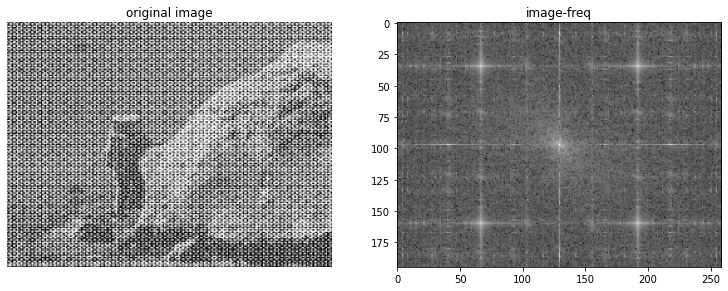

In [ ]:
img1 = cv2.imread("/content/drive/MyDrive/DIP/HW1/images/1.jpg", 0) 
freq = fp.fft2(img1)
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
plt.subplot(121), plt.imshow(img1, "gray"), plt.title("original image"), plt.axis("off")
plt.subplot(122),plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq")
plt.show()

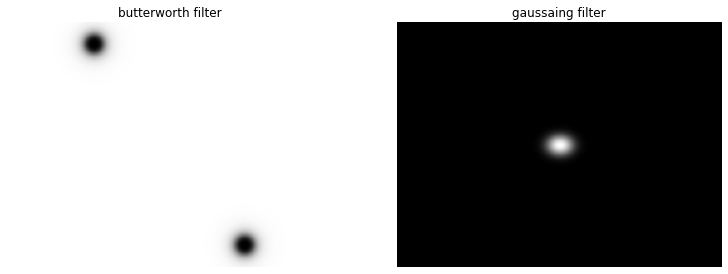

In [ ]:
filter_b = butterworthNRFilter(2*img1.shape)
filter_g = gaussLowPassFilter(2*img1.shape)

plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
plt.subplot(121), plt.imshow((np.log(1+np.abs(filter_b))), "gray"), plt.title("butterworth filter"), plt.axis("off")
plt.subplot(122), plt.imshow((np.log(1+np.abs(filter_g))), "gray"), plt.title("gaussaing filter"), plt.axis("off")
plt.show()

GaussLP
ButterworthNR
MButterworthNR


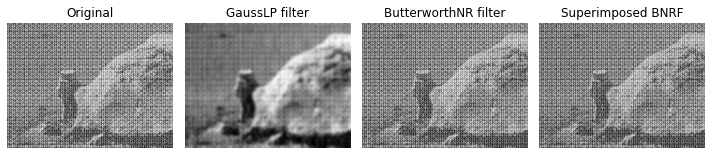

In [ ]:
fig = plt.figure(figsize=(10, 5))
imgGLPF = imgFrequencyFilter(img1, filterType="GaussLP", radius=100)
imgBNRF = imgFrequencyFilter(img1, filterType="ButterworthNR", radius=30)
imgSBNRF = imgFrequencyFilter(img1, filterType="MButterworthNR", radius=30)

plt.subplot(141), plt.title("Original"), plt.axis('off'), plt.imshow(img1,'gray')
plt.subplot(142), plt.title("GaussLP filter"), plt.axis('off'), plt.imshow(imgGLPF,'gray')
plt.subplot(143), plt.title("ButterworthNR filter"), plt.axis('off'), plt.imshow(imgBNRF,'gray')
plt.subplot(144), plt.title("Superimposed BNRF"), plt.axis('off'), plt.imshow(imgSBNRF,'gray')
plt.tight_layout()
plt.show()

همانطور که می بینیم در شکل دوم از سمت چپ نویزهای تصویر بیشتر حذف شده است. پس از همین استفاده می کنیم و آن را با استفاده از فیلتر لاپلاس شارپ می کنیم.

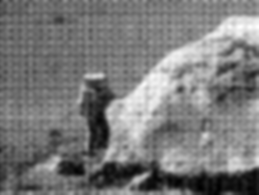

In [ ]:
cv2_imshow(imgGLPF)

Error of unknown filter


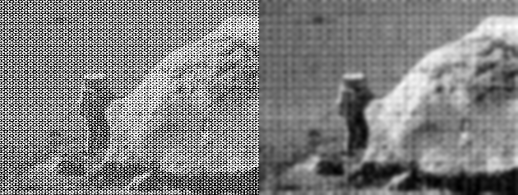

In [ ]:
imgLaplace = imgFrequencyFilter(imgGLPF, filterType="laplace")
result1 = imgLaplace + imgGLPF 
result1_ = np.hstack([img1, result1])
cv2_imshow(result1_)

#### image 2

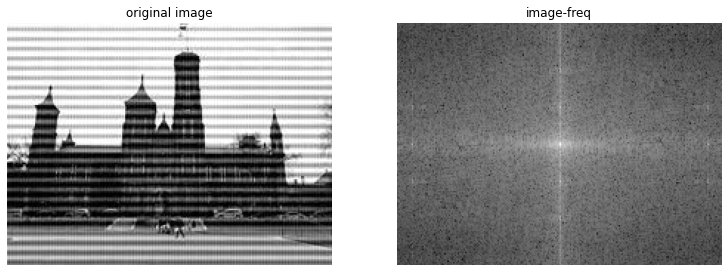

In [ ]:
img2 = cv2.imread("/content/drive/MyDrive/DIP/HW1/images/2.jpg", 0) 
freq = fp.fft2(img2)
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
plt.subplot(121), plt.imshow(img2, "gray"), plt.title("original image"), plt.axis("off")
plt.subplot(122), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq"), plt.axis("off")
plt.show()

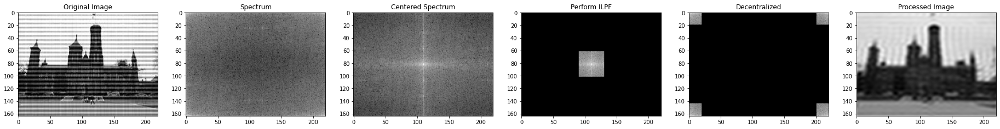

In [ ]:
image5 = cv2.imread('/content/drive/MyDrive/DIP/HW1/images/2.jpg')
image5_c1 = cv2.cvtColor(image5, cv2.COLOR_BGR2GRAY)
image5_c2 = np.fft.fft2(image5_c1)
image5_c3 = np.fft.fftshift(image5_c2)
image5_c4 = lowPassFiltering(image5_c3, 40)
image5_c5 = np.fft.ifftshift(image5_c4)
image5_c6 = np.fft.ifft2(image5_c5)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(161), plt.imshow(image5_c1, "gray"), plt.title("Original Image")
plt.subplot(162), plt.imshow(np.log(1+np.abs(image5_c2)), "gray"), plt.title("Spectrum")
plt.subplot(163), plt.imshow(np.log(1+np.abs(image5_c3)), "gray"), plt.title("Centered Spectrum")
plt.subplot(164), plt.imshow(np.log(1+np.abs(image5_c4)), "gray"), plt.title("Perform ILPF")
plt.subplot(165), plt.imshow(np.log(1+np.abs(image5_c5)), "gray"), plt.title("Decentralized")
plt.subplot(166), plt.imshow(np.abs(image5_c6), "gray"), plt.title("Processed Image")
plt.show()

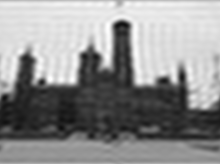

In [ ]:
cv2_imshow(image5_c6)

GaussLP


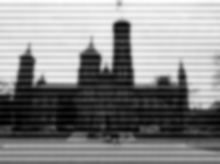

In [ ]:
imgGLPF = imgFrequencyFilter(img2, filterType="GaussLP", radius=100)
cv2_imshow(imgGLPF)

#### image 3

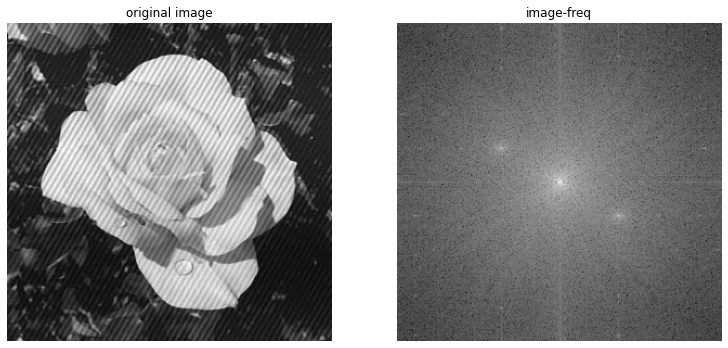

In [6]:
img3 = cv2.imread("/content/drive/MyDrive/DIP/HW1/images/3.jpg", 0) 
freq = fp.fft2(img3)
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
plt.subplot(121), plt.imshow(img3, "gray"), plt.title("original image"), plt.axis("off")
plt.subplot(122), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq"), plt.axis("off")
plt.show()

ButterworthNR


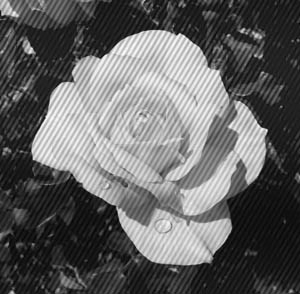

In [19]:
imgBNRF = imgFrequencyFilter(img3, filterType="ButterworthNR", radius=200)
cv2_imshow(imgBNRF)

GaussLP


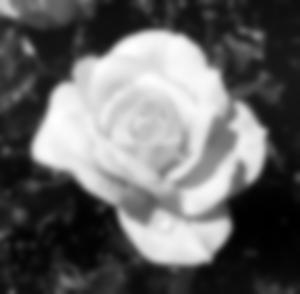

In [25]:
imgGLPF = imgFrequencyFilter(img3, filterType="GaussLP", radius=3)
cv2_imshow(imgGLPF)

#### image 4

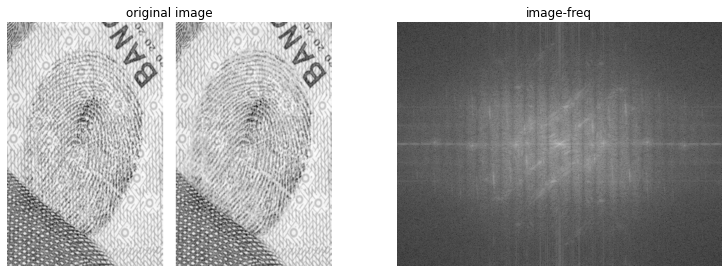

In [ ]:
img4 = cv2.imread("/content/drive/MyDrive/DIP/HW1/images/4.jpg", 0) 
freq = fp.fft2(img4)
plt.figure(figsize=(6.4*2, 4.8*2), constrained_layout=False)
plt.subplot(121), plt.imshow(img4, "gray"), plt.title("original image"), plt.axis("off")
plt.subplot(122), plt.imshow((20*np.log10( 0.1 + fp.fftshift(freq))).astype(int), "gray"), plt.title("image-freq"), plt.axis("off")
plt.show()

### 7

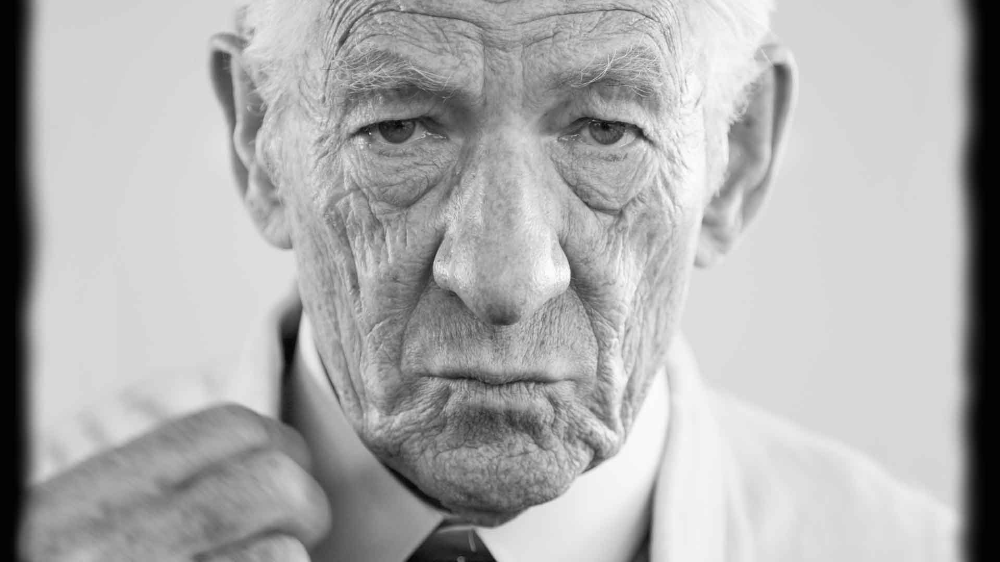

In [26]:
img = cv2.imread("/content/drive/MyDrive/DIP/HW1/images/11.jpg", 0) 
cv2_imshow(img)

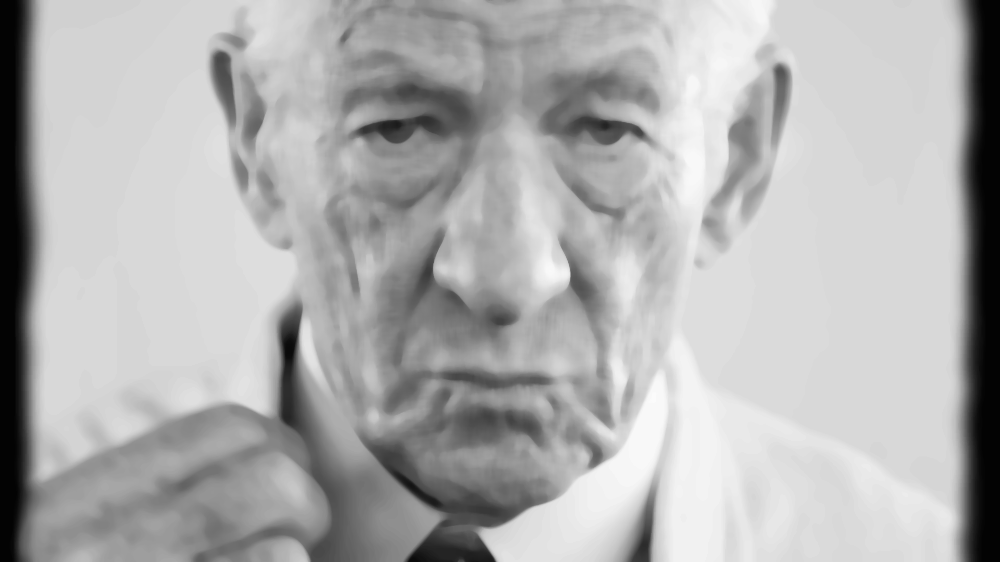

In [31]:
img_new = cv2.medianBlur(img,21)
cv2_imshow(img_new)

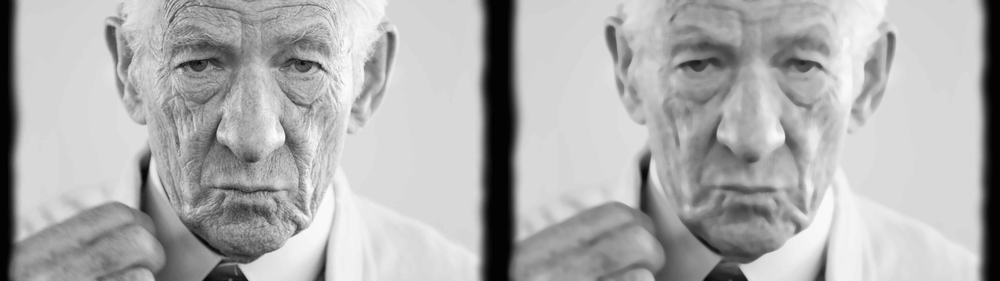

In [33]:
result = np.hstack([img, img_new])
cv2_imshow(result)

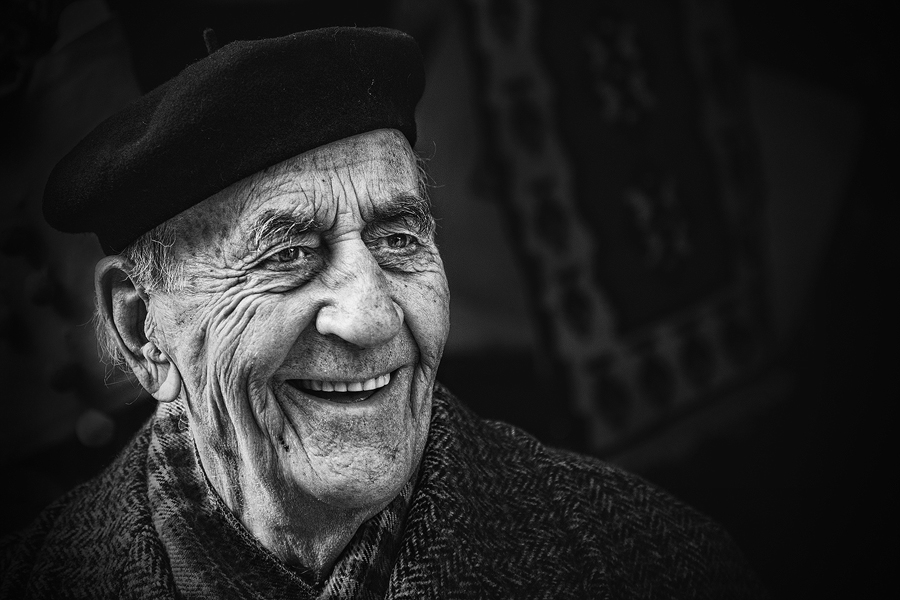

In [34]:
img = cv2.imread("/content/drive/MyDrive/DIP/HW1/images/12.jpg", 0) 
cv2_imshow(img)

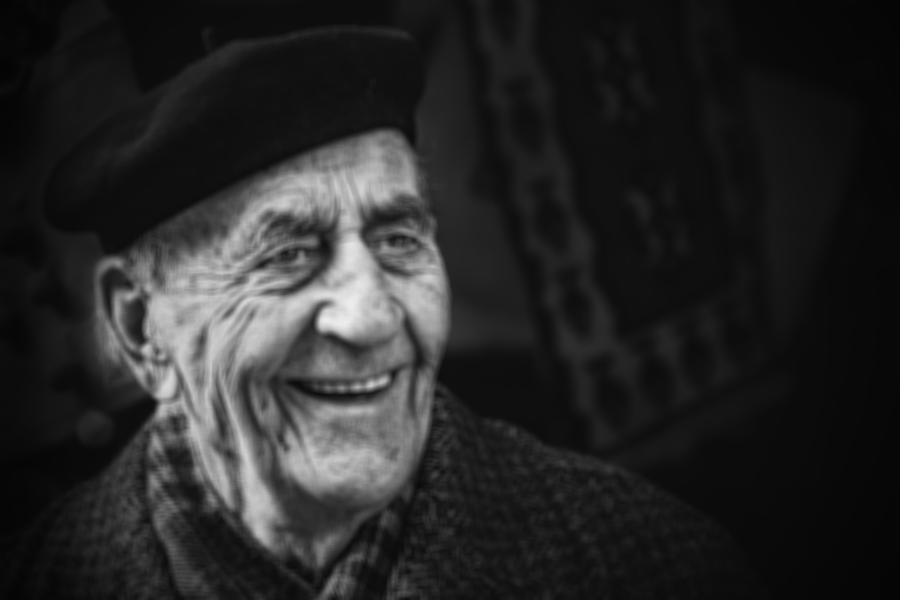

In [38]:
img_new = cv2.blur(img,(7,7))
cv2_imshow(img_new)

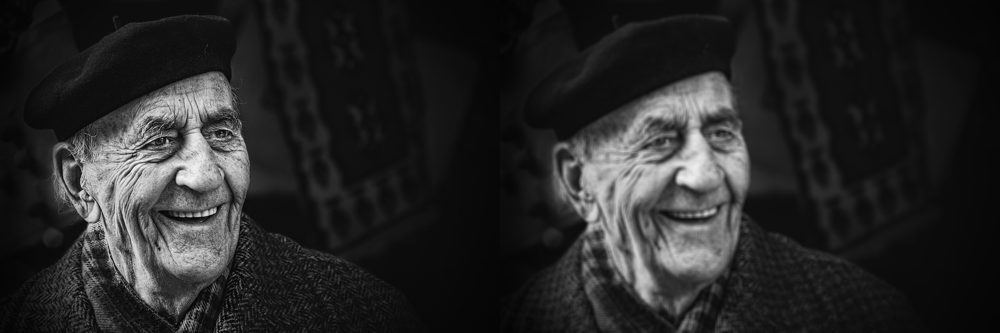

In [39]:
result = np.hstack([img, img_new])
cv2_imshow(result)